# OpenCV Library


Estimated time needed: **60** minutes


<h2>Objectives</h2>


Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing and transmitting, and gathering images through the internet. 
Python is an excellent choice as it has many image processing tools, computer vision, and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and the internet.
A digital image is simply a file on your computer. In this lab, you will gain an understanding  of these files and learn to work with these files with some popular libraries


<ul>
    <li><a href='#PIL'>Open CV </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
        </ul>
    </li>
    
</ul>


----


Download the image for the lab:


In [ ]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png  #tải ảnh từ URL

'wget' is not recognized as an internal or external command,
operable program or batch file.


'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


First, let's define a helper function to concatenate two images side-by-side. You will need to understand this code this moment, but this function will be used repeatedly in this tutorial to showcase the results.


In [11]:
from tkinter import Image #import thư viện Image từ tkinter
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height)) #tạo ảnh mới có kích thước bằng tổng chiều rộng của hai ảnh và chiều cao bằng chiều cao của ảnh cao hơn
    dst.paste(im1, (0, 0)) #dán ảnh im1 vào vị trí (0,0) của ảnh mới
    dst.paste(im2, (im1.width, 0)) #dán ảnh im2 vào vị trí (im1.width,0) của ảnh mới
    return dst #trả về ảnh mới

## Image Files and Paths  


An image is stored as a file on your computer. Below, we define `my_image` as the filename of a file in this directory.


In [124]:
my_image = "lenna.png"

Filename consists of two parts, the name of the file and the extension, separated by a full stop (`.`). The extension specifies the format of the image. There are two popular image formats -- Joint Photographic Expert Group image (or `.jpg`, `.jpeg`) and Portable Network Graphics (or `.png`). These file types make it simpler to work with images. For example, it compresses the image using sine/cosine approximations, taking less spaces on your drive to store the image.


Image files are stored in the file system of your computer. The location of it is specified using a "path", which is often unique. You can find the path of your current working directory with Python's `os` module. The `os` module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory. 


In [125]:
import os
cwd = os.getcwd()
cwd 

'd:\\Quan_VLU2025\\GIẢNG DẠY\\242_Thị giác máy tính'

The "path" to an image can be found using the following line of code.


In [126]:
#image_path = os.path.join(cwd, my_image)
image_path = "d:\Quan_VLU2025\GIẢNG DẠY\242_Thị giác máy tính\lenna.png".encode('utf-8').decode()
image_path

'd:\\Quan_VLU2025\\GIẢNG DẠY¢_Thị giác máy tính\\lenna.png'

## Load in Image in Python


OpenCV is a library used for computer vision. It has more functionality than the `PIL` library but is more difficult to use. We can import `OpenCV` as follows:


In [12]:
import cv2  #import thư viện cv2 để xử lý ảnh

The <code>imread()</code> method loads an image from the specified file, the input is the <code>path</code> of the image to be read (just like PIL), the <code>flag</code> paramter specifies how the image should be read, and the default value is <code>cv2.IMREAD_COLOR</code>.


In [56]:
my_image = "baboon.png" #đặt biến my_image là tên file ảnh - Dòng thêm vào để code chạy
image = cv2.imread(my_image) #đọc ảnh từ file

The result is a numpy array with intensity values as 8-bit unsigned integers. 


In [57]:
type(image) #kiểu dữ liệu của biến image

numpy.ndarray

We can get the shape of the array from the `shape` attribute.


In [58]:
image.shape #kích thước của ảnh dưới dạng (chiều cao, chiều rộng, số kênh màu)

(512, 512, 3)

The shape is the same as the PIL array, but there are several differences; for example, PIL returns in (R, G, B) format whereas OpenCV returns in (B, G, R) format.


Each pixel could take on 256 possible values as intensity, ranging from 0 to 255, with 0 being the lowest intensity and 255 being the highest. The maximum and minimum intensity values of an image can be obtained, respectively, by calling:


In [59]:
image.max() #giá trị lớn nhất của pixel trong ảnh

np.uint8(255)

and


In [60]:
image.min() #giá trị nhỏ nhất của pixel trong ảnh

np.uint8(0)

##  Plotting an Image 


You can use OpenCV's `imshow` function to open the image in a new window, but this may give you some issues in Jupyter:


In [61]:
#cv2.imshow('image', imgage) #hiển thị ảnh trong cửa sổ có tiêu đề 'image'
#cv2.waitKey(0) #chờ nhấn phím bất kỳ để đóng cửa sổ hiển thị ảnh
#cv2.destroyAllWindows() #đóng tất cả các cửa sổ hiển thị ảnh

You can also use the `imshow` function from the `matplotlib` library:


In [62]:
import matplotlib.pyplot as plt #import thư viện matplotlib để hiển thị ảnh

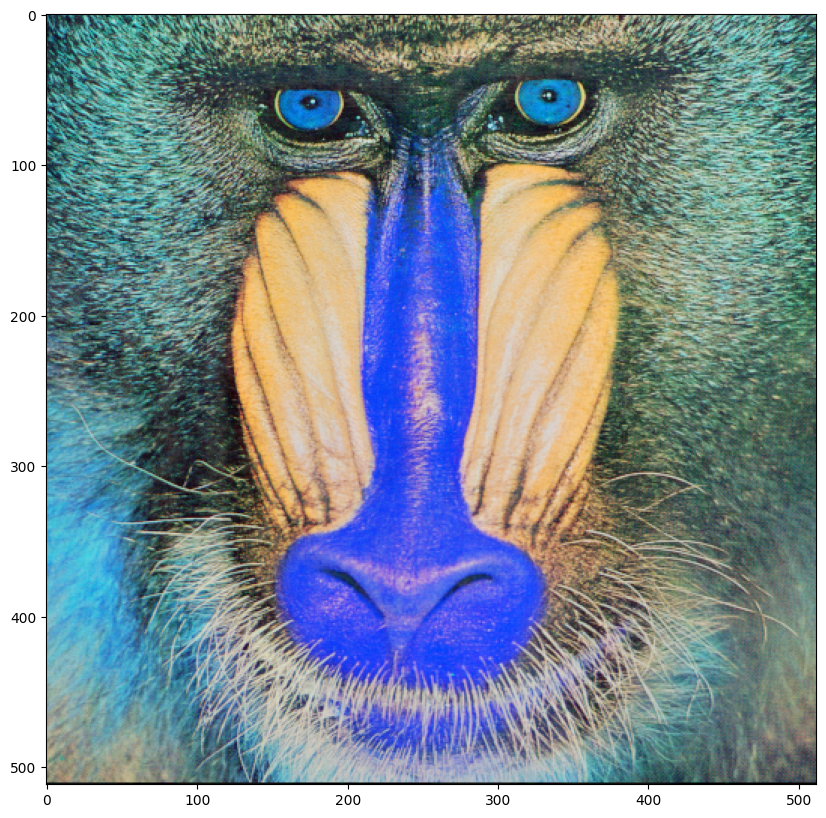

In [63]:
plt.figure(figsize=(10,10)) #tạo một figure có kích thước 10x10 inch
plt.imshow(image) #hiển thị ảnh 
plt.show() #hiển thị figure

The image output doesn't look natural. This is because the order of RGB Channels are different. We can change the color space with conversion code and the function `cvtColor` from the `cv2` library:


In [64]:
new_image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB) #chuyển đổi không gian màu từ BGR sang RGB

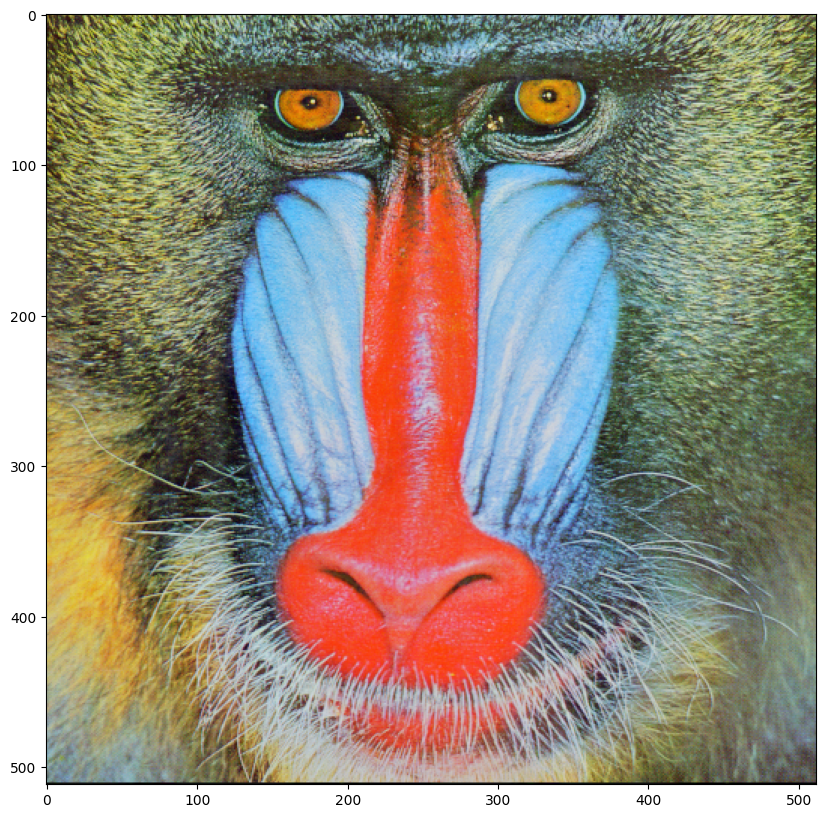

In [65]:
plt.figure(figsize=(10,10)) #tạo một figure có kích thước 10x10 inch
plt.imshow(new_image) #hiển thị ảnh
plt.show() #hiển thị figure

You can also load the image using its path, this comes in handy if the image is not in your working directory:


In [66]:
#Code thêm để chạy được
import os
cwd = os.getcwd() # Lấy đường dẫn thư mục hiện hành
image_path = os.path.join(cwd, my_image) # Tạo đường dẫn đầy đủ đến file ảnh

#Code góc
image = cv2.imread(image_path) #đọc ảnh từ file 
image.shape #kích thước của ảnh dưới dạng (chiều cao, chiều rộng, số kênh màu)

(512, 512, 3)

You can save the image as in `jpg` format.


In [67]:
cv2.imwrite("lenna.jpg", image) #lưu ảnh vào file lenna.jpg

True

### Grayscale Images


Grayscale images have pixel values representing the amount of light or intensity. Light shades of gray have a high-intensity darker shades have a lower intensity. White has the highest intensity, and black the lowest. We can convert an image to Gray Scale using a color conversion code and the function <code>cvtColor</code>.


The code for RGB to gray is <code>cv2.COLOR_BGR2GRAY</code>, we apply the function:


In [68]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) #chuyển đổi ảnh màu sang ảnh xám

The image array has only two dimensions, i.e. only one color channel:


In [69]:
image_gray.shape #kích thước của ảnh xám dưới dạng (chiều cao, chiều rộng)

(512, 512)

We can plot the image using `imshow` but we have to specify the color map is gray:


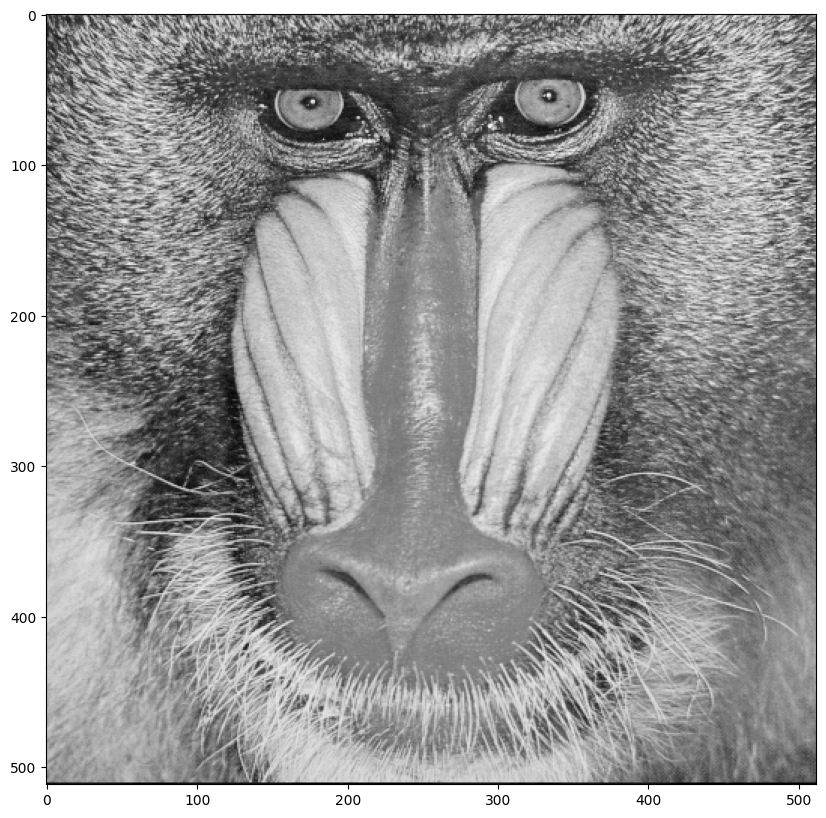

In [70]:
plt.figure(figsize=(10, 10)) #tạo một figure có kích thước 10x10 inch
plt.imshow(image_gray, cmap='gray') #hiển thị ảnh xám với bản đồ màu gray
plt.show() #hiển thị figure

We can save the image as a grayscale image, let's save it as a `jpg` as well, in the working directory.


In [71]:
cv2.imwrite('lena_gray_cv.jpg', image_gray) #lưu ảnh xám vào file lena_gray_cv.jpg

True

You can also load in a grayscale image we have to set <code>flag</code> parameter to gray color conversation code: <code>cv2.COLOR_BGR2GRAY</code>:


In [72]:
im_gray = cv2.imread('barbara.png', cv2.IMREAD_GRAYSCALE) #đọc ảnh barbara.png dưới dạng ảnh xám

We can plot the image:


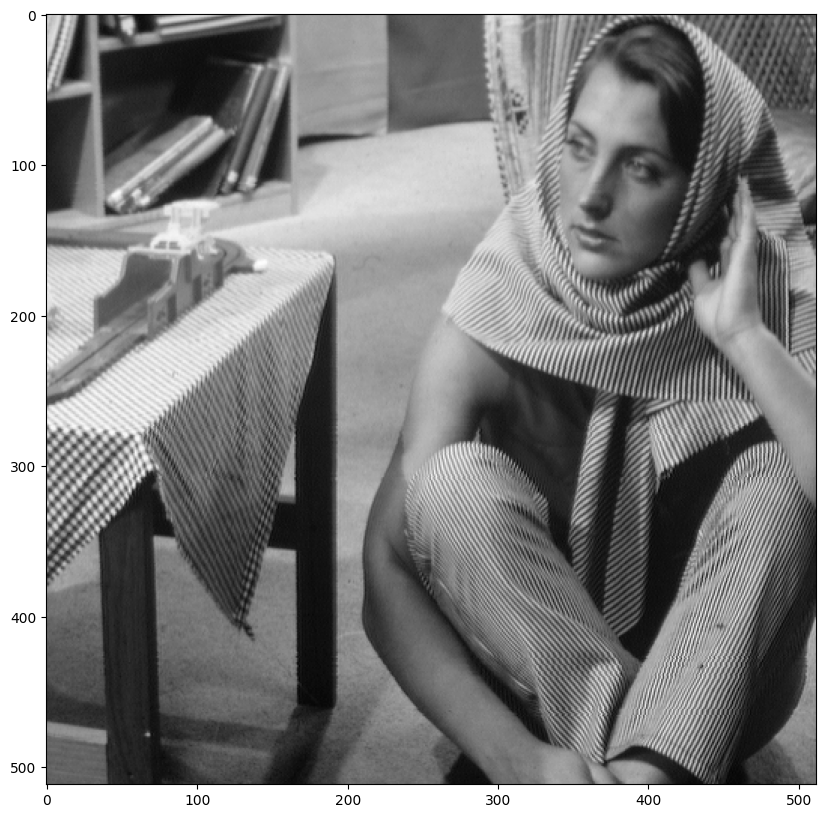

In [73]:
plt.figure(figsize=(10,10)) #tạo một figure có kích thước 10x10 inch
plt.imshow(im_gray,cmap='gray') #hiển thị ảnh xám với bản đồ màu gray
plt.show()

### Color Channels  


We can also work with the different color channels. Consider the following image:


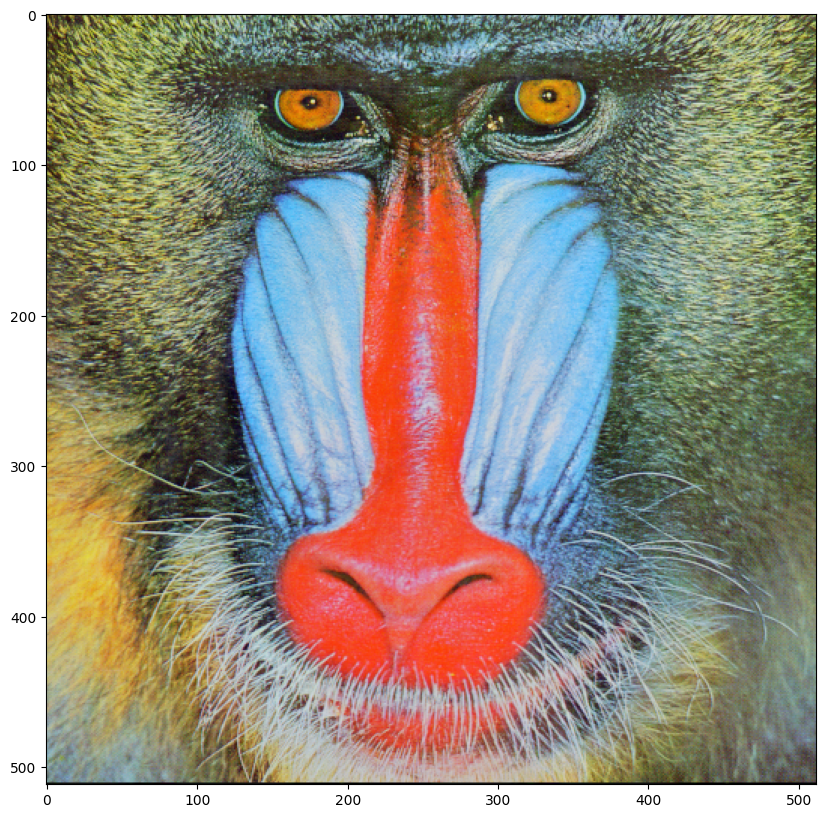

In [74]:
baboon=cv2.imread('baboon.png') #đọc ảnh baboon.png
plt.figure(figsize=(10,10)) #tạo một figure có kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon chuyển đổi không gian màu từ BGR sang RGB
plt.show()

We can obtain the different RGB colors and assign them to the variables <code>blue</code>, <code>green</code>, and <code>red</code>, in (B, G, R) format.


In [75]:
blue, green, red = baboon[:, :, 0], baboon[:, :, 1], baboon[:, :, 2] #tách các kênh màu xanh dương, xanh lá và đỏ từ ảnh baboon

We can concatenate each image channel the images using the function <code>vconcat</code>.


In [76]:
im_bgr = cv2.vconcat([blue, green, red]) #ghép các kênh màu lại theo chiều dọc

Plotting the color image next to the red channel in grayscale, we see that regions with red have higher intensity values.


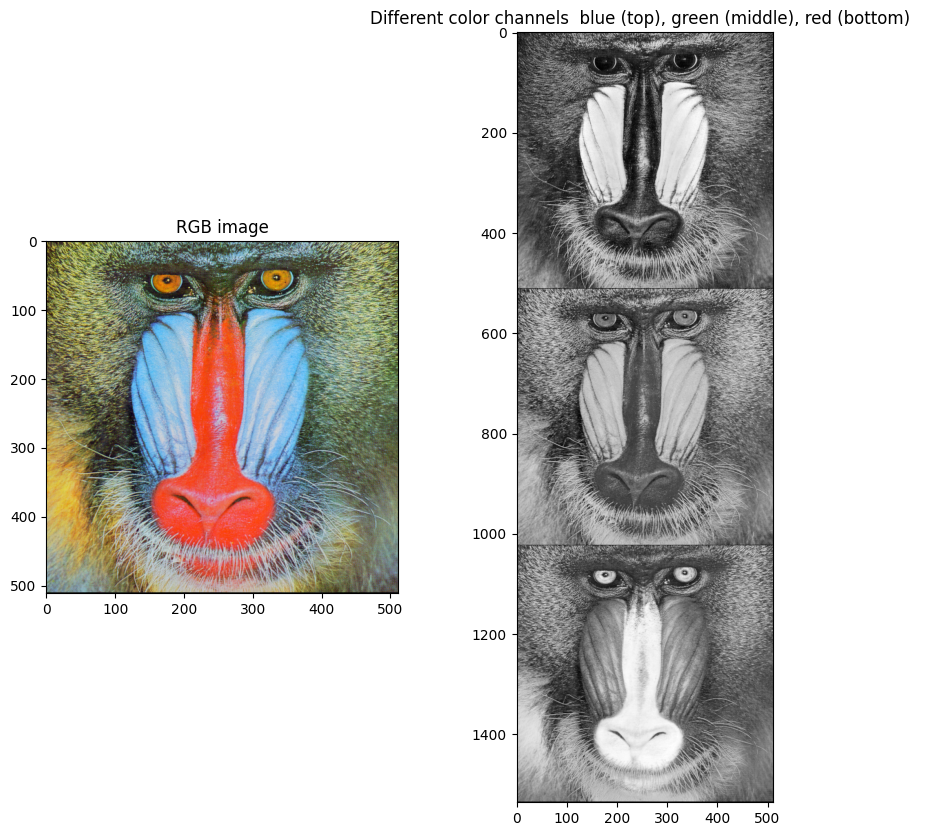

In [77]:
plt.figure(figsize=(10,10))
plt.subplot(121) #tạo subplot đầu tiên trong figure
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon chuyển đổi không gian màu từ BGR sang RGB
plt.title("RGB image") #tiêu đề cho subplot đầu tiên
plt.subplot(122) #tạo subplot thứ hai trong figure
plt.imshow(im_bgr,cmap='gray') #hiển thị ảnh im_bgr với bản đồ màu gray
plt.title("Different color channels  blue (top), green (middle), red (bottom)  ")
plt.show()

### Indexing  


We can use numpy slicing. For example, we can return the first 256 rows corresponding to the top half of the image:


In [78]:
rows = 256 #số hàng của ảnh

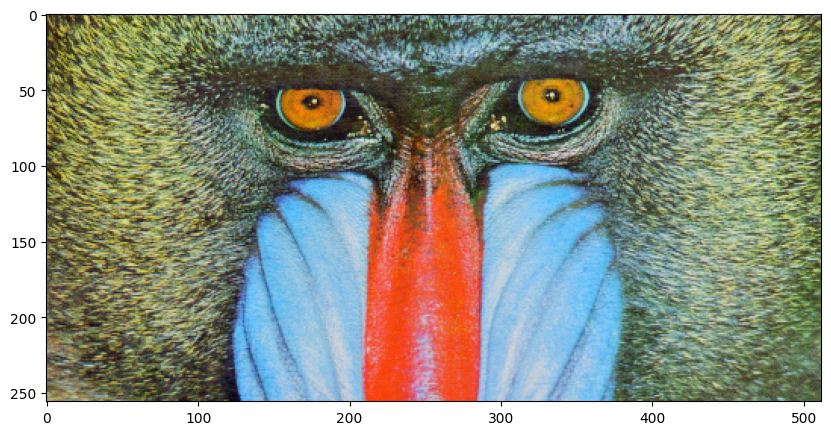

In [79]:
plt.figure(figsize=(10,10)) #tạo một figure có kích thước 10x10 inch
plt.imshow(new_image[0:rows,:,:]) #hiển thị ảnh mới từ hàng 0 đến hàng 255
plt.show()

We can also return the first 256 columns corresponding to the first half of the image:


In [80]:
columns = 256 #số cột của ảnh

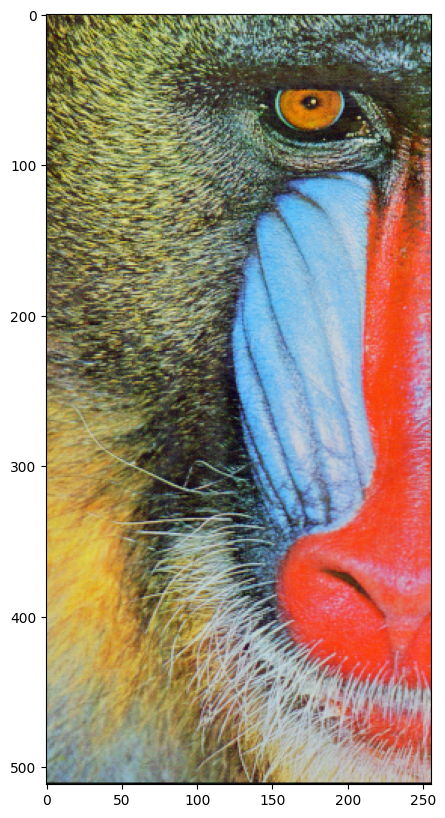

In [81]:
plt.figure(figsize=(10,10)) #tạo một figure có kích thước 10x10 inch
plt.imshow(new_image[:,0:columns,:]) #hiển thị ảnh mới từ cột 0 đến cột 255
plt.show()

If you want to reassign an array to another variable, you should use the `copy` method (we will cover this in the next section).


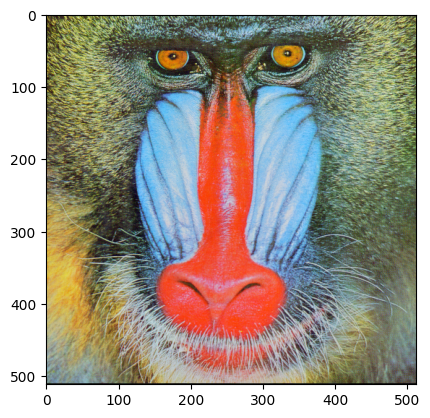

In [82]:
A = new_image.copy() #tạo bản sao của ảnh new_image
plt.imshow(A) #hiển thị ảnh A
plt.show()

If we do not apply the method `copy()`, the variable will point to the same location in memory. Consider the variable `B` below, if we set all values of array `A` to zero, since `A` and `B` points to the same object in the memory, `B` will also have all-zero elements:


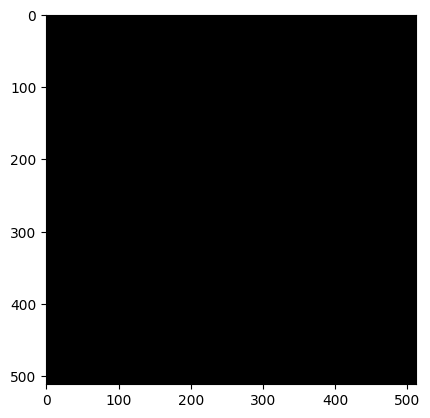

In [84]:
B = A #tạo bản sao của ảnh A
A[:,:,:] = 0 #gán tất cả các giá trị pixel của ảnh A thành 0
plt.imshow(B) #hiển thị ảnh B
plt.show()

We can also manipulate elements using indexing. In the following piece of code, we create a new array `baboon_red` and set all but the red color channels to zero. Therefore, when we display the image, it appears red:


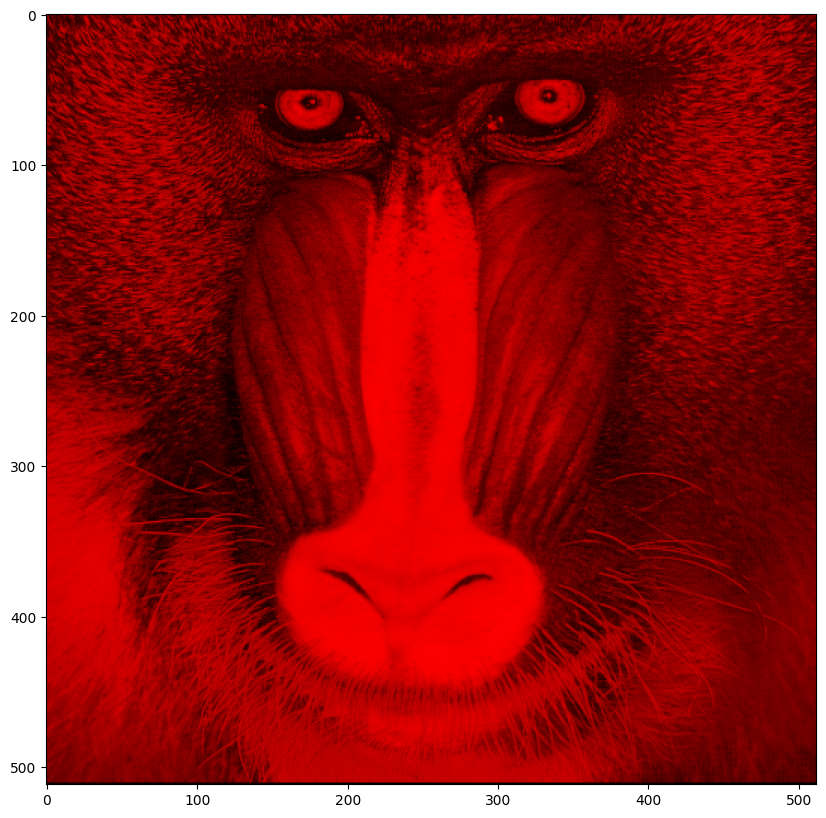

In [85]:
baboon_red = baboon.copy() #tạo bản sao của ảnh baboon
baboon_red[:, :, 0] = 0 #gán kênh màu xanh dương thành 0
baboon_red[:, :, 1] = 0 #gán kênh màu xanh lá thành 0
plt.figure(figsize=(10, 10)) #tạo một figure có kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon_red, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon_red chuyển đổi không gian màu từ BGR sang RGB
plt.show()

We can do the same for blue:  


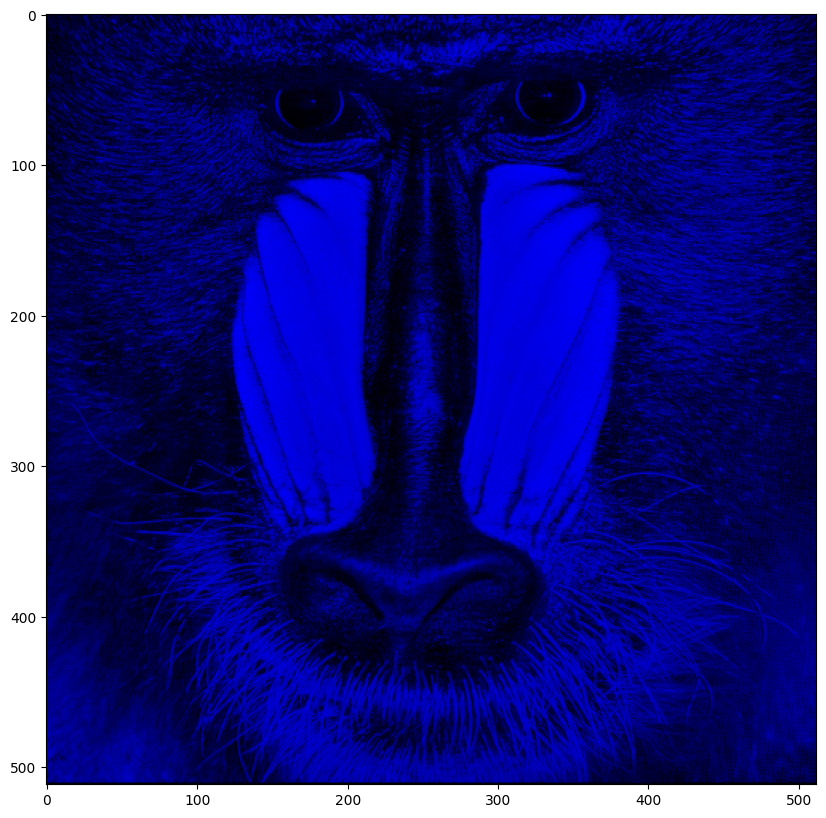

In [86]:
baboon_blue = baboon.copy() #tạo bản sao của ảnh baboon
baboon_blue[:, :, 1] = 0 #gán kênh màu xanh lá thành 0
baboon_blue[:, :, 2] = 0 #gán kênh màu đỏ thành 0
plt.figure(figsize=(10, 10)) #tạo một figure có kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon_blue chuyển đổi không gian màu từ BGR sang RGB
plt.show()

We can do the same for green:


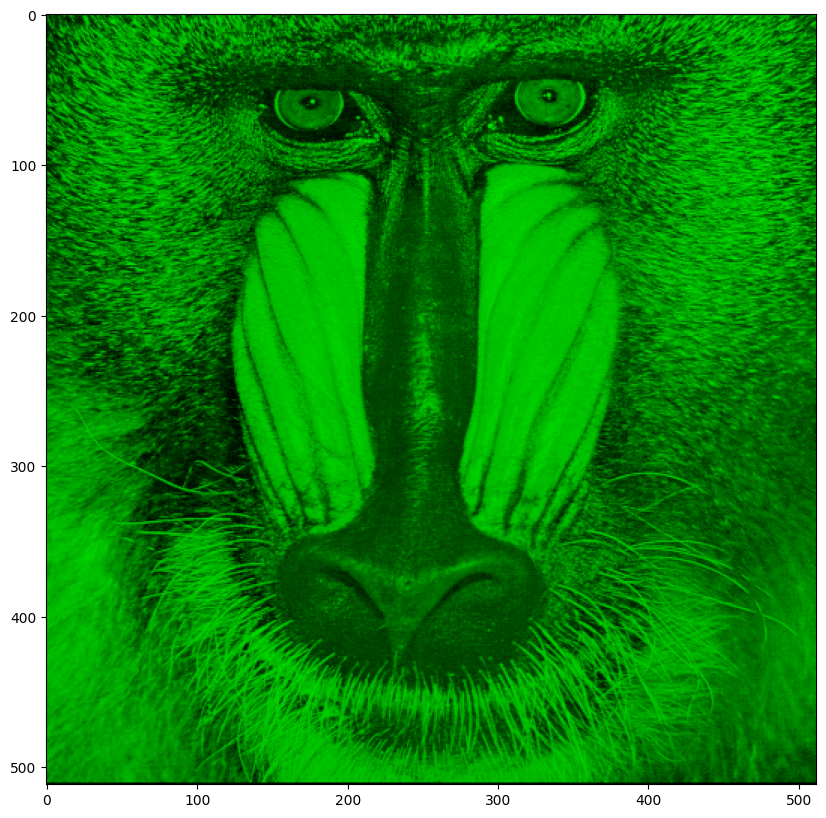

In [87]:
baboon_green = baboon.copy() #tạo bản sao của ảnh baboon
baboon_green[:, :, 0] = 0 #gán kênh màu xanh dương thành 0
baboon_green[:, :, 2] = 0 #gán kênh màu đỏ thành 0
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon_green, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon_green chuyển đổi không gian màu từ BGR sang RGB
plt.show()

In [53]:
image=cv2.imread('baboon.png') #đọc ảnh baboon.png

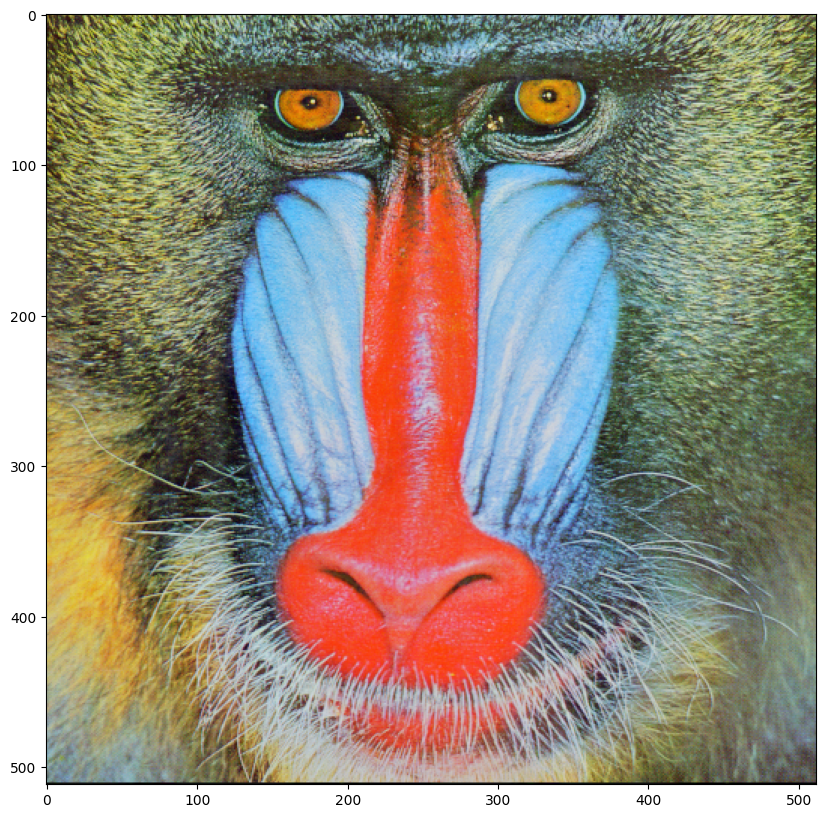

In [ ]:
plt.figure(figsize=(10,10)) 
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon chuyển đổi không gian màu từ BGR sang RGB   
plt.show()

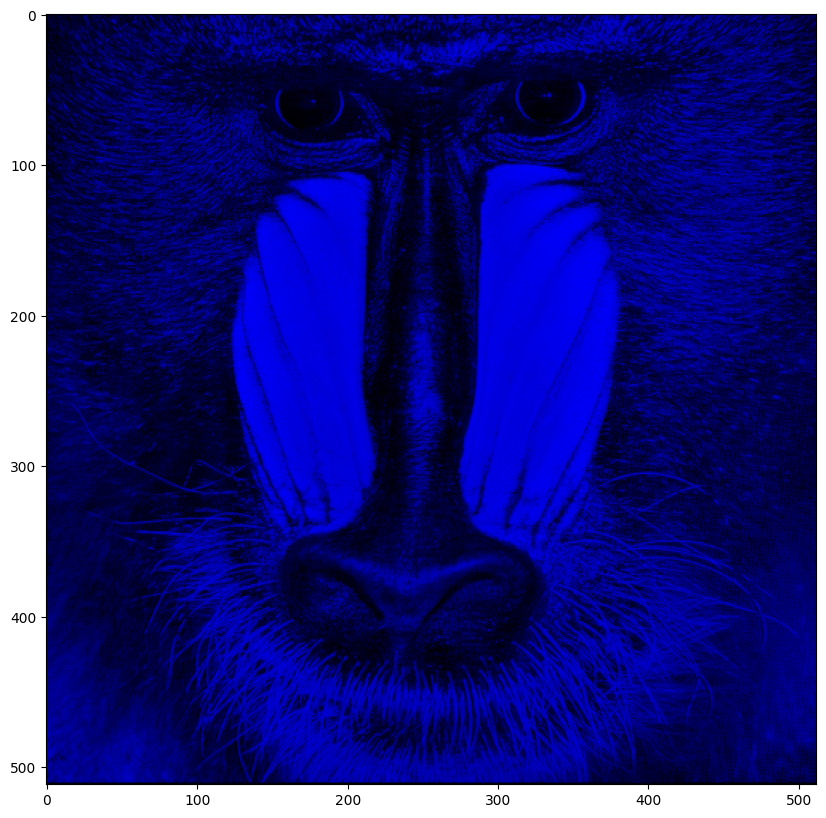

In [89]:
image=cv2.imread('baboon.png') # replace and add you image here name 
baboon_blue=image.copy() #tạo bản sao của ảnh baboon
baboon_blue[:,:,1] = 0 #gán kênh màu xanh lá thành 0
baboon_blue[:,:,2] = 0 #gán kênh màu đỏ thành 0
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon_blue chuyển đổi không gian màu từ BGR sang RGB
plt.show()

### Question 1: 
Use the image `baboon.png` from this lab or take any image you like.

Open the image and create a OpenCV Image object called `baboon_blue`, convert the image from BGR format to RGB format, get the blue channel out of it, and finally plot the image


In [ ]:
# write your script here

image=cv2.imread('baboon.png') # replace and add you image here name 
baboon_blue=image.copy() #tạo bản sao của ảnh baboon
baboon_blue[:,:,1] = 0 #gán kênh màu xanh lá thành 0
baboon_blue[:,:,2] = 0 #gán kênh màu đỏ thành 0
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)) #hiển thị ảnh baboon_blue chuyển đổi không gian màu từ BGR sang RGB
plt.show()

#Về bản chất, Pillow là thư viện nhẹ, tập trung vào các thao tác chỉnh sửa ảnh cơ bản (cắt, nén, xoay) với cú pháp thân thiện, phù hợp cho người mới bắt đầu. Trong khi đó, OpenCV là thư viện mạnh mẽ dành cho thị giác máy tính và AI, tối ưu hóa tốc độ xử lý ma trận và video thời gian thực.
#Sự khác biệt kỹ thuật lớn nhất nằm ở hệ màu: Pillow sử dụng chuẩn RGB, còn OpenCV sử dụng BGR. Do đó, khi làm việc với OpenCV, chúng ta thường phải thực hiện thêm bước chuyển đổi màu để hiển thị chính xác. Ngoài ra, OpenCV xử lý ảnh trực tiếp dưới dạng mảng NumPy, giúp việc tính toán đại số trên các điểm ảnh trở nên linh hoạt và hiệu quả hơn so với đối tượng Image thuần túy của Pillow.

Double-click **here** for a hint.

<!-- The hint is below:

baboon_blue[:,:,2] = 0

-->


Double-click **here** for the solution.

<!-- The answer is below:

baboon_blue=cv2.imread('baboon.png')
baboon_blue=cv2.cvtColor(baboon_blue, cv2.COLOR_BGR2RGB)
baboon_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->


<!--
<table>
    <tr>
        <th>Date (YYYY-MM-DD)</th>
        <th>Version</th>
        <th>Changed By</th>
        <th>Change Description</th>
    </tr>
    <tr>
        <td>2020-07-20</td>
        <td>0.2</td>
        <td>Azim</td>
        <td>Modified Multiple Areas</td>
    </tr>
    <tr>
        <td>2020-07-17</td>
        <td>0.1</td>
        <td>Azim</td>
        <td>Created Lab Template</td>
    </tr>
    <tr>
        <td>2021-03-06</td>
        <td>0.3</td>
        <td>Nayef</td>
        <td>Modified some codes</td>
    </tr>
</table>
-->
